# BART Tutorial:
# Subspace-Constrained Reconstruction of Frequency-Modulated SSFP Data

This notebook demonstrates how to use BART to
perform a subspace-constrained reconstruction in the style of

Roeloffs et al. "Frequency‐modulated SSFP with radial sampling and subspace reconstruction: A time‐efficient alternative to phase‐cycled bSSFP." Magnetic Resonance in Medicine 81.3 (2018): 1566-1579. https://doi.org/10.1002/mrm.27505

The raw data used in this reconstruction can be found under 
https://github.com/volroe/fmSSFP 

Note: Run this notebook with a bash kernel.

Volkert Roeloffs, University Medical Center Göttingen (volkert.roeloffs@med.uni-goettingen.de)

March 2021

## 1. Prerequisites

Make sure these paths are set correctly

`TOOLBOX_PATH=/path/to/bart`

`PATH=$TOOLBOX_PATH:$PATH`

In [1]:
# check bart availability and version - we recommend the most updated version (v0.7.00)
bart version

v0.7.00


In [2]:
# helper BASH function to write BART file to png,
# display both, magnitude and phase

function imshow () {
    cfl2png -CM $1 magn > /dev/null
    cfl2png -CP $1 phas > /dev/null

    cat magn_.png | display
    cat phas_.png | display
}

function show_timesteps () {

    data=$1
    shift
    pos=("$@")

    ind=0

    for t in "${pos[@]}"
    do
       bart slice 5 $t $data _slice$ind
       ind=$((ind+1))
    done

    bart join 6 `seq -f "_slice%g" 0 $((ind-1))` _slices
    DIM=`bart show -d 0 _slices`
    bart reshape $(bart bitmask 0 6) $((DIM*ind)) 1 {_,}slices

    imshow slices
}

## 2. Background

**Balanced steady-state free precession (bSSFP)**:
 - high SNR
 - banding artifacts or signal voids
 
**Phase-Cyled bSSFP**:
  - banding free composite image can be formed
  - multiple images acquired with different transmitter and receiver phase increments
  - different steady states have to be established
  
**Frequency-Modulated SSFP (fmSSFP)**:
  - bSSFP sequence with small but continuous changes in the phase increment (Foxall et al., 2002)
  - fmSSFP sweeps through entire frequency response
  - time-efficient as imaging is performed in dynamic steady state

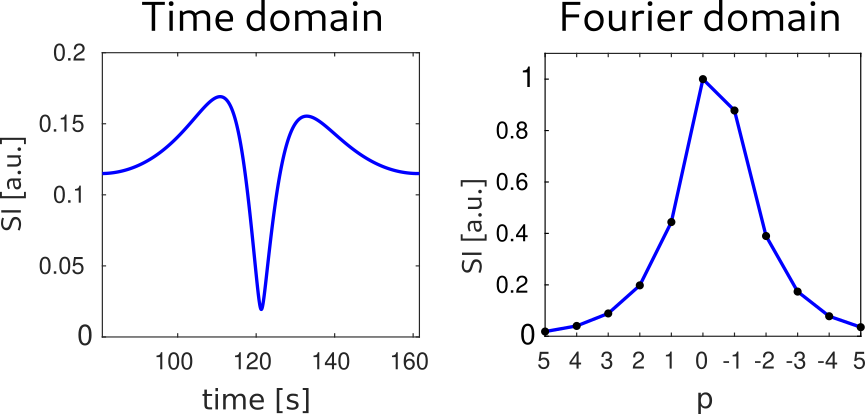

In [3]:
cat fmSSFP_timecourse_subspace.png | display 
# EPG-simulated fmSSFP signal response
# left: typical time course, right: signal intensity as a function of configuration order p

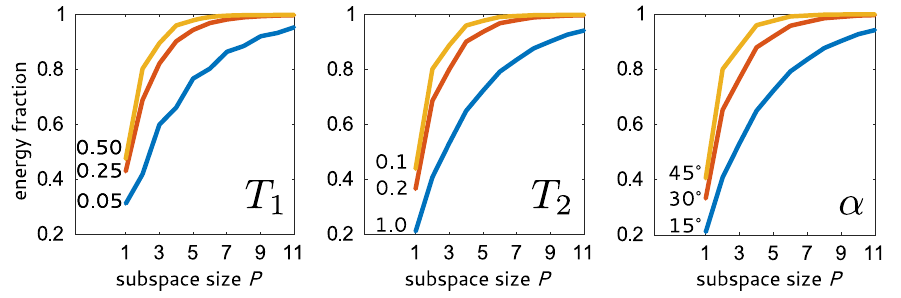

In [4]:
cat fmSSFP_subspace.png | display 
# Preserved energy fraction of a bSSFP signal as a function of subspace size
# for different values of T1 (left), T2 (middle) and flip angle (right)

## 3. Raw data

### 3.1 Loading Raw data
In the original publication 3D stack-of-stars encoded data sets are reconstructed. For demonstration purposes, we consider here only a single slice as obtained after inverse Fourier transforming along partition encoding direction.

In [5]:
wget -q https://github.com/volroe/fmSSFP/raw/master/brain-singleslice-goldenangle.cfl -O fmSSFP.cfl
wget -q https://github.com/volroe/fmSSFP/raw/master/brain-singleslice-goldenangle.hdr -O fmSSFP.hdr

PHS1=`bart show -d 1 fmSSFP`
SPOKES=`bart show -d 2 fmSSFP`
COILS=`bart show -d 3 fmSSFP`

head -n2 fmSSFP.hdr

# Dimensions
1 384 404 58 1 


### 3.2 Visualizing raw data

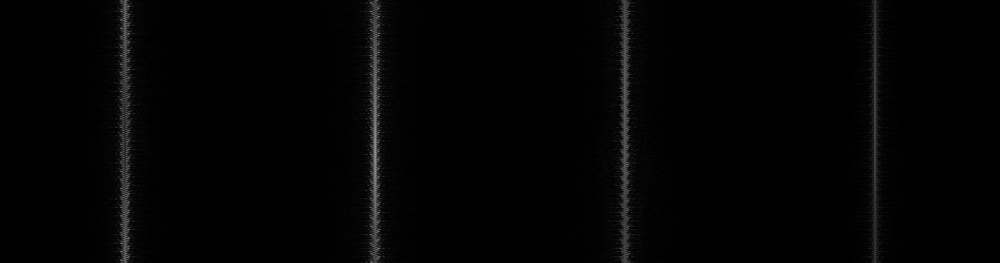

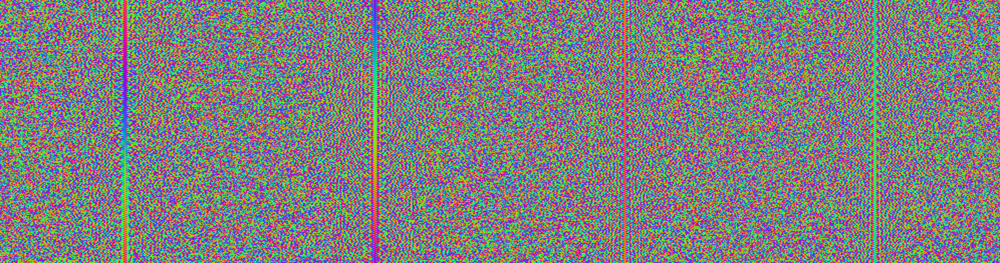

In [6]:
# let's look at the raw data from first 4 coils
bart extract 3 0 4 fmSSFP tmp
bart reshape `bart bitmask 1 3` $((PHS1*4)) 1 tmp tmp
imshow tmp

## 4. Reconstruction

### 4.1 Generation of low-frequency Fourier basis

In [7]:
P=8 # subspace size

bart delta 16 $(bart bitmask 5 6) $P eye # create PxP identity matrix
bart resize -c 5 $SPOKES eye eye_cl # zero padding in time direction
bart fft -u $(bart bitmask 5) eye_cl basis
head -n2 basis.hdr

# Dimensions
1 1 1 1 1 404 8 1 1 1 1 1 1 1 1 1 


### 4.2 Subspace-constrained reconstruction

#### 4.2.1 Generate radial, Golden-Angle trajectory corrected for gradient delays

In [8]:
# gradient delays are determined with RING (Rosenzweig et al., 2018) 
# should ideally be done on the DC part of the full 3D stack-of-stars data
# here, performed on an individual partition 

# generate nominal trajectory (w/o delays)
bart traj -r -c -G -x$PHS1 -y$SPOKES traj_nocorr
bart reshape $(bart bitmask 2 3) $SPOKES 1 traj_nocorr traj_nocorr_r

# use nominal trajectory to estimate delays
GD=$(bart estdelay -R -n5 traj_nocorr_r fmSSFP)
echo $GD

# generate corrected trajectory from estimated delays
bart traj -q$GD -r -c -G -x$PHS1 -y$SPOKES traj
bart reshape $(bart bitmask 2 3) $SPOKES 1 traj traj_1

0.144872:0.477416:-0.060898


#### 4.2.2 Channel compression, inverse nuFFT and ESPIRIT

In [9]:
VCOILS=10

# perform channel compression on combined data
bart cc -p$VCOILS -A -S fmSSFP meas_cc
    
# apply inverse nufft 
bart nufft -i -d$PHS1:$PHS1:1 traj_1 meas_cc img
    
# transform back to k-space and compute sensitivities
bart fft -u $(bart bitmask 0 1 2) img ksp

# run ESPIRIT to obtain coil sensitivity profiles
bart ecalib -S -t0.01 -m1 ksp sens

Done.
Done.
Done.


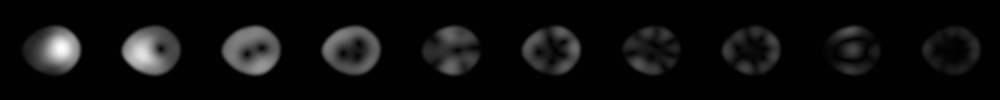

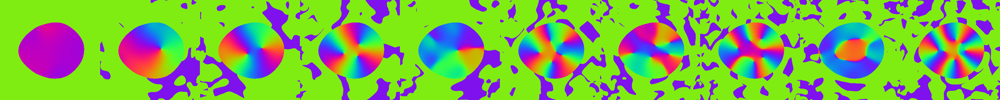

In [10]:
# visualize
bart reshape `bart bitmask 0 3` $((PHS1*VCOILS)) 1 sens tmp
imshow tmp

#### 4.2.3 Bringing it all together: Use basis and sensitivities for subspace-constrained reconstruction

In [11]:
REG=0.0005
LLRBLK=8
ITERATIONS=100

# transform data
bart transpose 2 5 meas_cc meas_t
bart transpose 2 5 traj_1 traj_t

# set to false to perform actual computation
if false ; then
    bart copy out_precomp out
else
    # reconstruction with subspace constraint
    bart pics -e -d5 -R L:3:3:$REG -b$LLRBLK -i$ITERATIONS -t traj_t -B basis meas_t sens out
fi

# flags:
#        -e scale stepsize based on maximal eigenvalue
#        -d debug level
#        -R L:3:3 locally low rank regularization with spatial decimation

Basis: [384 384   1  10   1 404   8   1   1   1   1   1   1   1   1   1 ]
Max:   [384 384   1  10   1   1   8   1   1   1   1   1   1   1   1   1 ]
[  1 384   1  10   1 404   8   1   1   1   1   1   1   1   1   1 ]
[384 384   1  10   1   1   8   1   1   1   1   1   1   1   1   1 ]
ksp : [  1 384   1  10   1 404   8   1   1   1   1   1   1   1   1   1 ]
cim : [384 384   1  10   1   1   8   1   1   1   1   1   1   1   1   1 ]
traj: [  3 384   1   1   1 404   1   1   1   1   1   1   1   1   1   1 ]
wgh : [  1 384   1   1   1 404   1   1   1   1   1   1   1   1   1   1 ]
bas : [  1   1   1   1   1 404   8   1   1   1   1   1   1   1   1   1 ]
NUFFT: Toeplitz mode
psf_dims: [384 384   1   1   1 404   1   1   1   1   1   1   1   1   1   1 ]
nufft kernel dims: [  1 384   1   1   1   8   8   1   1   1   1   1   1   1   1   1   1 404 ]
nufft psf dims:    [768 768   1   1   1   8   8   1   1   1   1   1   1   1   1   1   1   1 ]
nufft traj dims:   [  3 384   1   1   1   1   1   1   1   1   1   1

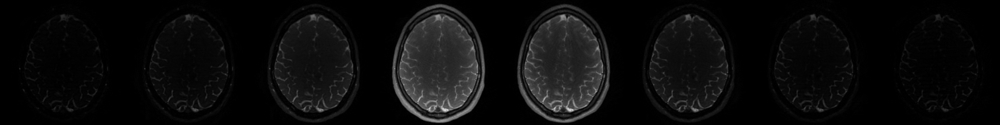

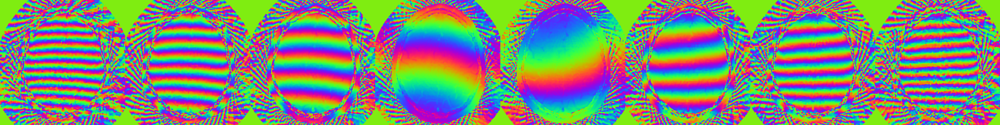

In [12]:
# crop and transpose to resize FoV and to get anatomically correct orientation
READ_NOOS=$((PHS1/2))
bart crop 0 $READ_NOOS out out_c
bart crop 1 $READ_NOOS out_c out_cc
bart transpose 0 1 out_cc out_cct

# flip to get consistent order of coefficients
bart flip `bart bitmask 6` out_cct out_orient

bart reshape `bart bitmask 0 6` $((READ_NOOS*8)) 1 out_orient tmp
imshow tmp

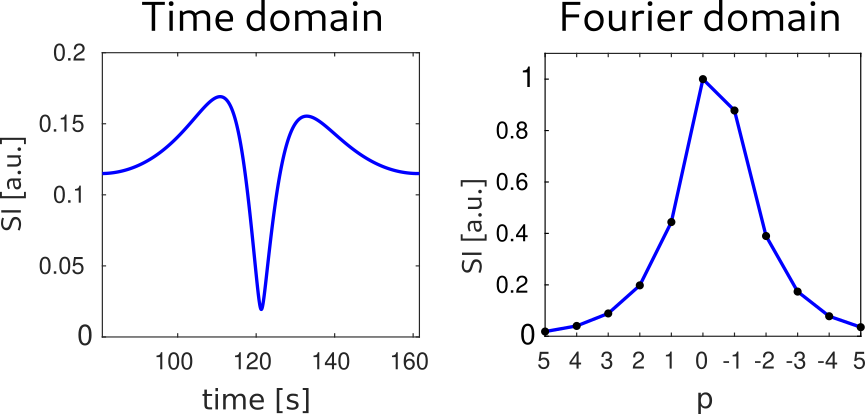

In [13]:
# compare with simulation from above
cat fmSSFP_timecourse_subspace.png | display 

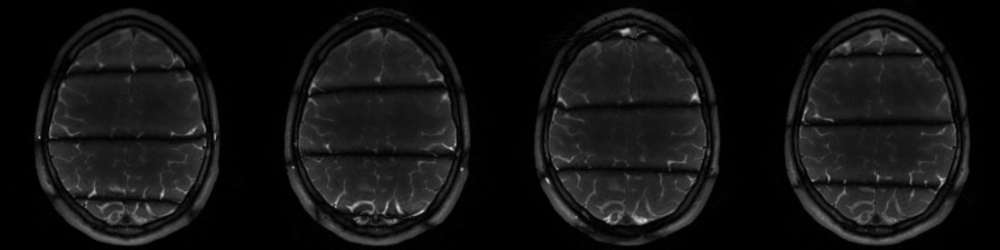

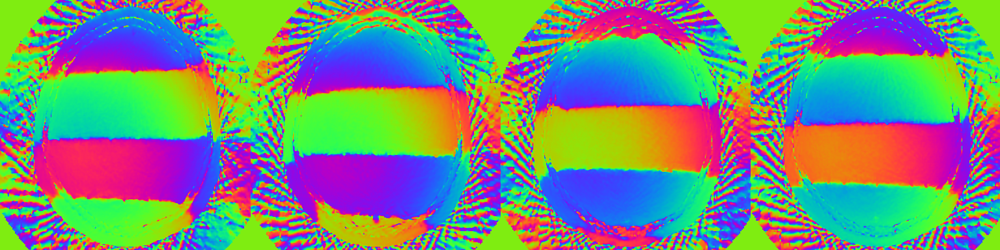

In [14]:
# synthesize phase-cycled bSSFP-like images (time domain representation)
bart fmac -s `bart bitmask 6` out_orient basis bSSFPsyn
show_timesteps bSSFPsyn 0 101 202 303

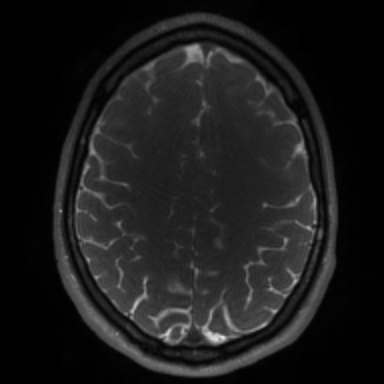

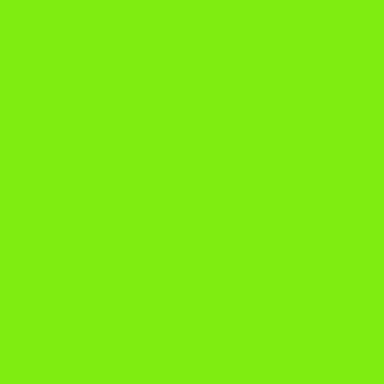

In [15]:
# generate composite image by combining all subspace coefficients in root-of-sum-of-squares manner
bart rss `bart bitmask 6` out_orient rss_image
imshow rss_image

## Questions?

Don't hesitate to ask!